<a href="https://colab.research.google.com/github/elzains/Catalens-Capstone-Project/blob/main/Skripsi_Catalens_2024_V4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **SKRIPSI CATALENS 2024**

Nama : Zainal Arifin<br>
Email : zafinsalsyaf@gmail.com<br>

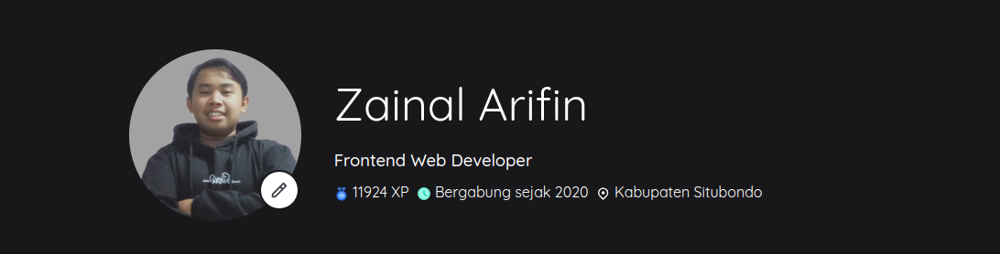



**1.  Import Library TensorFlow, Keras dan Masukkan Dataset**



In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, Activation, Flatten, MaxPool2D

tf.__version__

'2.15.0'

In [ ]:
# !wget http://47.245.118.30/data/catalens.zip

--2024-05-30 02:27:12--  http://47.245.118.30/data/catalens.zip
Connecting to 47.245.118.30:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 352421699 (336M) [application/zip]
Saving to: ‘catalens.zip’

catalens.zip        100%[===================>] 336.09M   144KB/s    in 41m 44s 

2024-05-30 03:08:56 (137 KB/s) - ‘catalens.zip’ saved [352421699/352421699]




**2.   Setup dan Import Library**



In [2]:
!pip install split_folders

In [3]:
import zipfile,os
import splitfolders
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import numpy as np
from google.colab import files
from keras.preprocessing import image

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [45]:
# Tentukan path folder sumber di Google Drive
source_folder = '/content/drive/My Drive/catalens'

# Tentukan path output untuk data train dan val
output_folder = '/content/drive/My Drive/serverdata/data'

# Lakukan pembagian dataset dengan rasio 80:20 untuk train dan val
splitfolders.ratio(source_folder, output=output_folder, seed=1337, ratio=(.8, .2))

Copying files: 3000 files [01:25, 35.12 files/s]


**3. Memisahkan Data Train dan Validasi**

In [46]:
# local_zip = 'catalens.zip'
# zip_ref = zipfile.ZipFile(local_zip, 'r')
# zip_ref.extractall('bigdata')
# zip_ref.close()

# splitfolders.ratio('bigdata/catalens', output="catalens/data", seed=1337, ratio=(.6, .4))

# data_dir = 'catalens/data'
# train_dir = os.path.join(data_dir, 'train')
# validation_dir = os.path.join(data_dir, 'val')

data_dir = '/content/drive/My Drive/serverdata/data'
train_dir = os.path.join(data_dir, 'train')
validation_dir = os.path.join(data_dir, 'val')

In [47]:
print('Cataract Train Set 60% =', len(os.listdir('/content/drive/My Drive/serverdata/data/train/cataract')))
print('Keratitis Train Set 60% =', len(os.listdir('/content/drive/My Drive/serverdata/data/train/keratitis')))
print('Normal Train Set 60% =', len(os.listdir('/content/drive/My Drive/serverdata/data/train/normal')))

Cataract Train Set 60% = 800
Keratitis Train Set 60% = 800
Normal Train Set 60% = 800


In [48]:
print('Cataract Valid Set 40% =', len(os.listdir('/content/drive/My Drive/serverdata/data/val/cataract')))
print('Keratitis Valid Set 40% =', len(os.listdir('/content/drive/My Drive/serverdata/data/val/keratitis')))
print('Normal Valid Set 40% =', len(os.listdir('/content/drive/My Drive/serverdata/data/val/normal')))

Cataract Valid Set 40% = 200
Keratitis Valid Set 40% = 200
Normal Valid Set 40% = 200


In [49]:
train_cataract_dir = os.path.join(train_dir, 'cataract')
train_glaucoma_dir = os.path.join(train_dir, 'keratitis')
train_normal_dir = os.path.join(train_dir, 'normal')

validation_cataract_dir = os.path.join(validation_dir, 'cataract')
validation_glaucoma_dir = os.path.join(validation_dir, 'keratitis')
validation_normal_dir = os.path.join(validation_dir, 'normal')

In [50]:
cataract_imgs = os.listdir(train_cataract_dir)
glaucoma_imgs = os.listdir(train_glaucoma_dir)
normal_imgs = os.listdir(train_normal_dir)

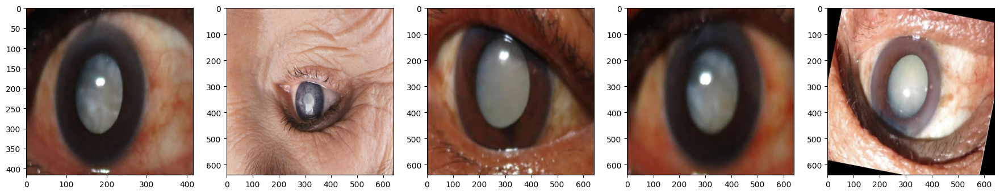

In [51]:
plt.figure(figsize=(22, 5))
for i, img_path in enumerate(cataract_imgs[:5]):
  sp = plt.subplot(1, 5, i+1)
  img = mpimg.imread(os.path.join(train_cataract_dir, img_path))
  plt.imshow(img)
plt.show()

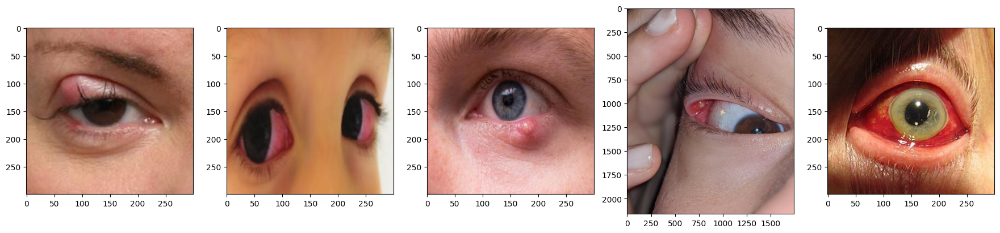

In [52]:
plt.figure(figsize=(22, 5))
for i, img_path in enumerate(glaucoma_imgs[:5]):
  sp = plt.subplot(1, 5, i+1)
  img = mpimg.imread(os.path.join(train_glaucoma_dir, img_path))
  plt.imshow(img)
plt.show()

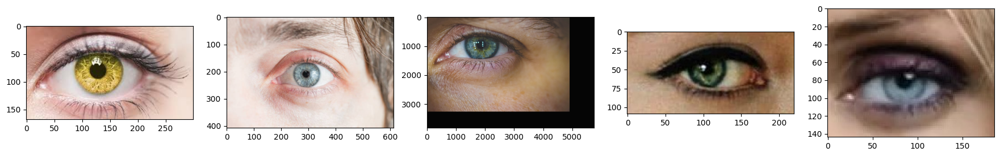

In [53]:
plt.figure(figsize=(22, 5))
for i, img_path in enumerate(normal_imgs[:5]):
  sp = plt.subplot(1, 5, i+1)
  img = mpimg.imread(os.path.join(train_normal_dir, img_path))
  plt.imshow(img)
plt.show()

**4. Augmentasi Gambar**

In [117]:
train_datagen = ImageDataGenerator(
    # rotation_range=20, #tambahan
    # width_shift_range=0.2,
    # height_shift_range=0.2,
    # fill_mode='nearest',
    # #tambahan
    rescale=1./255,
    validation_split=0.9999,
    # shear_range=0.2,
    # zoom_range=0.2,
    horizontal_flip=True
)

validation_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.9999
)

In [128]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (100, 100),
    batch_size = 32,
    class_mode = 'categorical',
    shuffle = True
)

valid_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size = (100, 100),
    batch_size = 32,
    class_mode = 'categorical',
    shuffle = True,
)

Found 2400 images belonging to 3 classes.
Found 600 images belonging to 3 classes.


In [119]:
train_generator.class_indices

{'cataract': 0, 'keratitis': 1, 'normal': 2}

In [120]:
valid_generator.class_indices

{'cataract': 0, 'keratitis': 1, 'normal': 2}

**5. Melatih sebuah model Convolutional Neural Network**

In [121]:
model = Sequential()

model.add(Conv2D(16, kernel_size=3, activation='relu', input_shape=(100, 100, 3)))
model.add(MaxPool2D(2,2))
model.add(Dropout(0.25))
model.add(Conv2D(32, kernel_size=3, activation='relu'))
model.add(MaxPool2D(2,2))
model.add(Dropout(0.25))
model.add(Conv2D(64, kernel_size=3, activation='relu'))
model.add(MaxPool2D(2,2))
model.add(Dropout(0.25))
model.add(Conv2D(128, kernel_size=3, activation='relu'))
model.add(MaxPool2D(2,2))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(3, activation='softmax'))

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 98, 98, 16)        448       
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 49, 49, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_25 (Dropout)        (None, 49, 49, 16)        0         
                                                                 
 conv2d_25 (Conv2D)          (None, 47, 47, 32)        4640      
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 23, 23, 32)        0         
 ng2D)                                                           
                                                                 
 dropout_26 (Dropout)        (None, 23, 23, 32)       

**6. Kompilasi Model & Alur Pelatihan**

In [122]:
model.compile(
    optimizer = 'RMSprop',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

In [123]:
# Coba
%reload_ext tensorboard
# rm -rf ./logs/
# model = create_model()
# model = create_model()
model.compile(
    optimizer = 'RMSprop',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

log_dir = "logs/fit/"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [147]:
# Melakukan loop untuk melatih model
epochs = 10
steps_per_epoch = len(train_generator)

for epoch in range(epochs):
    print(f'Epoch {epoch + 1}/{epochs}')
    train_generator.reset()  # Reset generator untuk setiap epoch
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=1,
        verbose=1
    )

history = model.fit(
    train_generator,
    steps_per_epoch=32,
    epochs=10,
    validation_data=valid_generator,
    validation_steps=32,
    callbacks=[tensorboard_callback],
    verbose=1
)

Epoch 1/10
75/75 [==============================] - 39s 514ms/step - loss: 0.2060 - accuracy: 0.9262
Epoch 2/10
75/75 [==============================] - 40s 528ms/step - loss: 0.1805 - accuracy: 0.9312
Epoch 3/10
75/75 [==============================] - 37s 490ms/step - loss: 0.1796 - accuracy: 0.9379
Epoch 4/10
75/75 [==============================] - 39s 521ms/step - loss: 0.1677 - accuracy: 0.9400
Epoch 5/10
75/75 [==============================] - 39s 520ms/step - loss: 0.1433 - accuracy: 0.9517
Epoch 6/10
75/75 [==============================] - 37s 496ms/step - loss: 0.1377 - accuracy: 0.9508
Epoch 7/10
75/75 [==============================] - 39s 524ms/step - loss: 0.1324 - accuracy: 0.9521
Epoch 8/10
75/75 [==============================] - 38s 502ms/step - loss: 0.1256 - accuracy: 0.9554
Epoch 9/10
75/75 [==============================] - 37s 489ms/step - loss: 0.1094 - accuracy: 0.9633
Epoch 10/10
75/75 [==============================] - 37s 491ms/step - loss: 0.1219 - accura

32/32 [==============================] - 67s 2s/step - loss: 0.1003 - accuracy: 0.9648 - val_loss: 0.2638 - val_accuracy: 0.9417
Epoch 2/10
32/32 [==============================] - 18s 535ms/step - loss: 0.1132 - accuracy: 0.9639
Epoch 3/10
32/32 [==============================] - 17s 525ms/step - loss: 0.1013 - accuracy: 0.9639
Epoch 4/10
32/32 [==============================] - 15s 478ms/step - loss: 0.0911 - accuracy: 0.9688
Epoch 5/10
32/32 [==============================] - 17s 512ms/step - loss: 0.1007 - accuracy: 0.9600
Epoch 6/10
32/32 [==============================] - 17s 517ms/step - loss: 0.0846 - accuracy: 0.9775
Epoch 7/10
32/32 [==============================] - 17s 522ms/step - loss: 0.1164 - accuracy: 0.9531
Epoch 8/10
32/32 [==============================] - 19s 576ms/step - loss: 0.0717 - accuracy: 0.9736
Epoch 9/10
32/32 [==============================] - 18s 541ms/step - loss: 0.1088 - accuracy: 0.9648
Epoch 10/10
32/32 [==============================] - 18s 551ms/

In [164]:
# Misalkan Anda telah mempersiapkan train_generator dan valid_generator dengan benar

epochs = 3
steps_per_epoch = len(train_generator)

# Loop untuk melatih model
for epoch in range(epochs):
    print(f'Epoch {epoch + 1}/{epochs}')
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=1,
        validation_data=valid_generator,
        validation_steps=len(valid_generator),
        callbacks=[tensorboard_callback],
        verbose=1
    )

# # Alternatifnya, jika menggunakan model.fit() langsung
# history = model.fit(
#     train_generator,
#     steps_per_epoch=steps_per_epoch,
#     epochs=epochs,
#     validation_data=valid_generator,
#     validation_steps=len(valid_generator),
#     callbacks=[tensorboard_callback],
#     verbose=1
# )


Epoch 1/3
75/75 [==============================] - 44s 587ms/step - loss: 0.0289 - accuracy: 0.9908 - val_loss: 0.7362 - val_accuracy: 0.9433
Epoch 2/3
75/75 [==============================] - 45s 585ms/step - loss: 0.0470 - accuracy: 0.9908 - val_loss: 0.7764 - val_accuracy: 0.9400
Epoch 3/3
75/75 [==============================] - 46s 606ms/step - loss: 0.0164 - accuracy: 0.9958 - val_loss: 0.7592 - val_accuracy: 0.9383


**7. Evaluasi Model**

In [165]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 95329), started 1:36:19 ago. (Use '!kill 95329' to kill it.)

<IPython.core.display.Javascript object>

In [166]:
score = model.evaluate(train_generator)

print('Loss:', round(score[0] * 100, 2), '%')
print('Accuracy:', round(score[1] * 100, 2), '%')

75/75 [==============================] - 28s 374ms/step - loss: 6.9757e-04 - accuracy: 0.9996
Loss: 0.07 %
Accuracy: 99.96 %


In [167]:
score = model.evaluate(valid_generator)

print('Loss:', round(score[0] * 100, 2), '%')
print('Accuracy:', round(score[1] * 100, 2), '%')

19/19 [==============================] - 5s 263ms/step - loss: 0.7592 - accuracy: 0.9383
Loss: 75.92 %
Accuracy: 93.83 %


In [ ]:
tf.saved_model.save(model, "RPS_SAVED_MODEL")

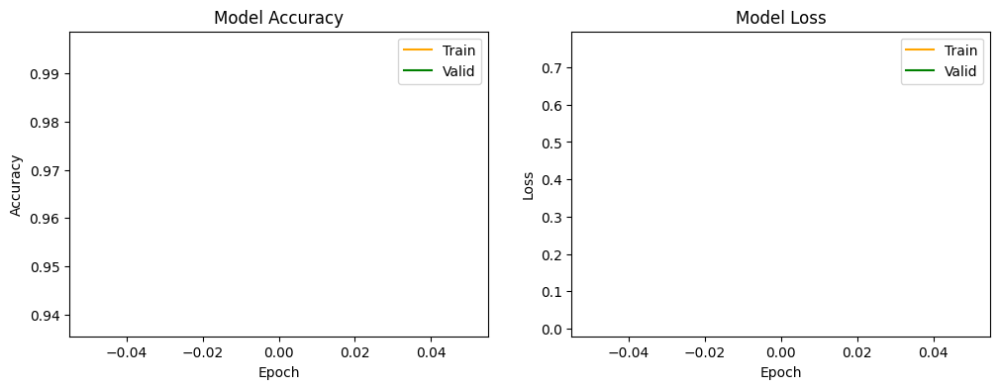

In [169]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(acc, color='orange')
plt.plot(val_acc, color='green')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(loss, color='orange')
plt.plot(val_loss, color='green')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()

19/19 [==============================] - 5s 261ms/step


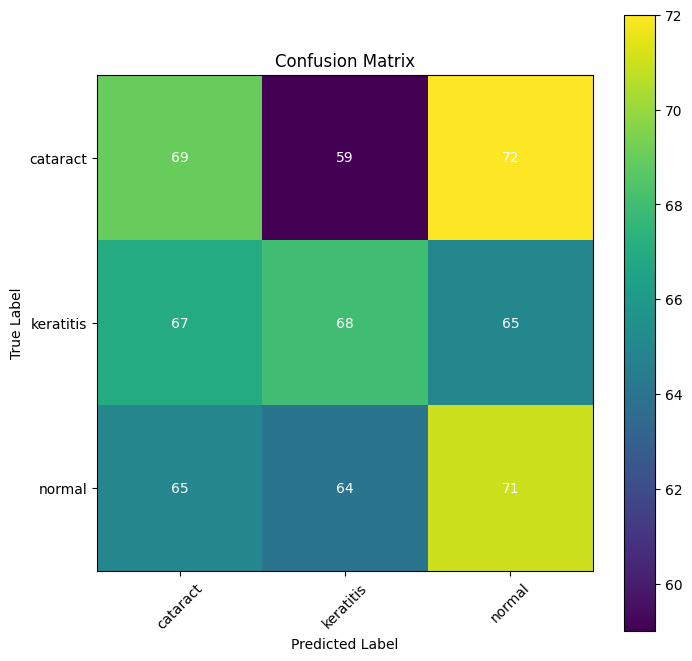

In [170]:
# prompt: Buatkan confussion matrixnya juga dong

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import numpy as np
import itertools

# Get the predictions from the model
predictions = model.predict(valid_generator)

# Get the true labels
true_labels = valid_generator.classes

# Create a confusion matrix
cm = confusion_matrix(true_labels, np.argmax(predictions, axis=1))

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
plt.imshow(cm, cmap='viridis')
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(valid_generator.class_indices))
plt.xticks(tick_marks, valid_generator.class_indices, rotation=45)
plt.yticks(tick_marks, valid_generator.class_indices)

# Add labels to each cell
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment='center', verticalalignment='center', color='white' if cm[i, j] > cm.max() / 2 else 'black')

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


Saving 1c9459c6c00ed324ead18a79e85b64db47ae3b746f211f0634d0299a757a1415.jpg to 1c9459c6c00ed324ead18a79e85b64db47ae3b746f211f0634d0299a757a1415.jpg
1/1 [==============================] - 0s 26ms/step
1c9459c6c00ed324ead18a79e85b64db47ae3b746f211f0634d0299a757a1415.jpg
>>> Gambar ini termasuk Normal


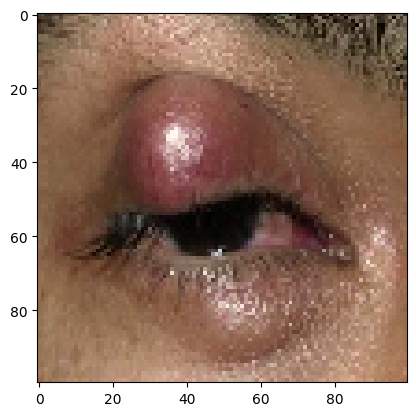

In [155]:
uploaded = files.upload()

for fn in uploaded.keys():


  path = fn
  img = tf.keras.utils.load_img(path, target_size=(100,100))

  imgplot = plt.imshow(img)
  x = tf.keras.utils.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=32)

  print(fn)
  if classes[0,0] == 0.0:
   print('>>> Gambar ini termasuk Normal') #Cataract
  elif classes[0,1] == 1.0:
   print('>>> Gambar ini termasuk Glaucoma') #Keratitis
  else :
   print('>>> Gambar ini termasuk Cataract') # Normal